# Semiconductor Wafer Yield Analysis
이 노트북에서는 업로드된 `csv` 파일을 이용해 웨이퍼 수율을 계산하고, EDA 및 분류 모델링을 수행합니다.

## 1. 환경 설정 및 라이브러리 Import

In [2]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

## 2. 데이터 로드

In [3]:
import os
import pandas as pd

folder_path = r"..\wafer_anal_prj"
csv_files = [f for f in os.listdir(folder_path) if f.lower().endswith('.csv')]

# 각 CSV 파일을 읽어들여 딕셔너리에 저장 (key: 파일명, value: DataFrame)
dfs = {}
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    dfs[file] = pd.read_csv(file_path)

print("CSV 파일 로드 완료:", list(dfs.keys()))

CSV 파일 로드 완료: ['synthetic_wafer_dataset_final_100_edgering_rotateddiverse.csv']


## 3. 데이터 구조 확인

In [4]:
for file_name, df in dfs.items():
    print(f"\n===== {file_name} 데이터프레임 정보 =====")
    df.info()
    
    df = df.fillna('missing')  # 결측치를 'missing'으로 채움
    print(df.describe(include='all'))
    
    print(f"\n----- {file_name} 각 컬럼별 결측치 수 -----")
    print(df.isnull().sum())


===== synthetic_wafer_dataset_final_100_edgering_rotateddiverse.csv 데이터프레임 정보 =====
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Columns: 443 entries, Sensor-1 to Label
dtypes: float64(442), object(1)
memory usage: 346.2+ KB
          Sensor-1    Sensor-2    Sensor-3    Sensor-4   Sensor-5    Sensor-6  \
count   100.000000  100.000000  100.000000  100.000000  100.00000  100.000000   
unique         NaN         NaN         NaN         NaN        NaN         NaN   
top            NaN         NaN         NaN         NaN        NaN         NaN   
freq           NaN         NaN         NaN         NaN        NaN         NaN   
mean    108.552950  111.004990  110.450930  110.640440  110.27234  110.873460   
std       7.807787    3.649402    4.489921    4.494802    5.24989    3.828496   
min      80.021000   94.165000   91.810000   89.813000   89.88600   93.592000   
25%     110.815250  111.004250  110.698500  111.133250  111.06350  111.370750   
50%     111.718500 

In [5]:
df.columns = df.columns.str.strip().str.lower()
print(df.columns.tolist())

['sensor-1', 'sensor-2', 'sensor-3', 'sensor-4', 'sensor-5', 'sensor-6', 'sensor-7', 'sensor-8', 'sensor-9', 'sensor-10', 'sensor-11', 'sensor-12', 'sensor-13', 'sensor-14', 'sensor-15', 'sensor-16', 'sensor-17', 'sensor-18', 'sensor-19', 'sensor-20', 'sensor-21', 'sensor-22', 'sensor-23', 'sensor-24', 'sensor-25', 'sensor-26', 'sensor-27', 'sensor-28', 'sensor-29', 'sensor-30', 'sensor-31', 'sensor-32', 'sensor-33', 'sensor-34', 'sensor-35', 'sensor-36', 'sensor-37', 'sensor-38', 'sensor-39', 'sensor-40', 'sensor-41', 'sensor-42', 'sensor-43', 'sensor-44', 'sensor-45', 'sensor-46', 'sensor-47', 'sensor-48', 'sensor-49', 'sensor-50', 'sensor-51', 'sensor-52', 'sensor-53', 'sensor-54', 'sensor-55', 'sensor-56', 'sensor-57', 'sensor-58', 'sensor-59', 'sensor-60', 'sensor-61', 'sensor-62', 'sensor-63', 'sensor-64', 'sensor-65', 'sensor-66', 'sensor-67', 'sensor-68', 'sensor-69', 'sensor-70', 'sensor-71', 'sensor-72', 'sensor-73', 'sensor-74', 'sensor-75', 'sensor-76', 'sensor-77', 'sensor

In [6]:
import pandas as pd

# 파일 읽기
df = pd.read_csv(r'..\wafer_anal_prj\synthetic_wafer_dataset_final_100_edgering_rotateddiverse.csv')

# 상위 10개 행 미리보기
print(df.head(2))

   Sensor-1  Sensor-2  Sensor-3  Sensor-4  Sensor-5  Sensor-6  Sensor-7  \
0   102.277   102.492   102.893   102.568   102.776   102.917   102.694   
1   102.231   103.086   102.740   102.278   101.855   103.015   102.522   

   Sensor-8  Sensor-9  Sensor-10  ...  Sensor-434  Sensor-435  Sensor-436  \
0   102.720   102.398    104.952  ...     112.006     111.085     111.495   
1   103.135   101.850    104.341  ...     111.802     111.664     111.944   

   Sensor-437  Sensor-438  Sensor-439  Sensor-440  Sensor-441     TTV   Label  
0     111.874     112.610     112.634     111.759     111.990  11.157  Center  
1     111.903     112.321     112.013     112.154     112.185  11.505  Center  

[2 rows x 443 columns]


In [7]:
print("컬럼명 목록:", df.columns.tolist())
for col in df.columns:
    print(f"\n[{col}] 고유값:")
    print(df[col].unique())

컬럼명 목록: ['Sensor-1', 'Sensor-2', 'Sensor-3', 'Sensor-4', 'Sensor-5', 'Sensor-6', 'Sensor-7', 'Sensor-8', 'Sensor-9', 'Sensor-10', 'Sensor-11', 'Sensor-12', 'Sensor-13', 'Sensor-14', 'Sensor-15', 'Sensor-16', 'Sensor-17', 'Sensor-18', 'Sensor-19', 'Sensor-20', 'Sensor-21', 'Sensor-22', 'Sensor-23', 'Sensor-24', 'Sensor-25', 'Sensor-26', 'Sensor-27', 'Sensor-28', 'Sensor-29', 'Sensor-30', 'Sensor-31', 'Sensor-32', 'Sensor-33', 'Sensor-34', 'Sensor-35', 'Sensor-36', 'Sensor-37', 'Sensor-38', 'Sensor-39', 'Sensor-40', 'Sensor-41', 'Sensor-42', 'Sensor-43', 'Sensor-44', 'Sensor-45', 'Sensor-46', 'Sensor-47', 'Sensor-48', 'Sensor-49', 'Sensor-50', 'Sensor-51', 'Sensor-52', 'Sensor-53', 'Sensor-54', 'Sensor-55', 'Sensor-56', 'Sensor-57', 'Sensor-58', 'Sensor-59', 'Sensor-60', 'Sensor-61', 'Sensor-62', 'Sensor-63', 'Sensor-64', 'Sensor-65', 'Sensor-66', 'Sensor-67', 'Sensor-68', 'Sensor-69', 'Sensor-70', 'Sensor-71', 'Sensor-72', 'Sensor-73', 'Sensor-74', 'Sensor-75', 'Sensor-76', 'Sensor-77',

# 전처리 df 칼럼 생성

In [8]:
# 컬럼명 전처리(공백 제거, 소문자 통일)
df.columns = df.columns.str.strip().str.lower()

# 센서 컬럼 추출 (sensor-로 시작)
sensor_cols = [col for col in df.columns if col.startswith('sensor-')]

# 센서 번호 기준으로 정렬
import re
def sensor_num(col):
    m = re.match(r'sensor-(\d+)', col)
    return int(m.group(1)) if m else 9999
sensor_cols = sorted(sensor_cols, key=sensor_num)

print(sensor_cols[:10])  # 앞부분 확인
print(sensor_cols[-10:]) # 뒷부분 확인

['sensor-1', 'sensor-2', 'sensor-3', 'sensor-4', 'sensor-5', 'sensor-6', 'sensor-7', 'sensor-8', 'sensor-9', 'sensor-10']
['sensor-432', 'sensor-433', 'sensor-434', 'sensor-435', 'sensor-436', 'sensor-437', 'sensor-438', 'sensor-439', 'sensor-440', 'sensor-441']


# 데이터셋 대로 웨이퍼 생성

In [9]:
import matplotlib.pyplot as plt
import numpy as np
import re
from matplotlib.colors import LinearSegmentedColormap
from collections import defaultdict

rows, cols = 25, 25
sensor_shape = (rows, cols)
yy, xx = np.ogrid[:rows, :cols]
center_y, center_x = (rows - 1) / 2, (cols - 1) / 2
radius = min(center_y, center_x)
mask = (yy - center_y)**2 + (xx - center_x)**2 <= radius**2
center = np.array([center_y, center_x])


In [10]:
coords = list(zip(*np.where(mask)))
layered_coords = defaultdict(list)
for coord in coords:
    r = int(np.linalg.norm(np.array(coord) - center))
    layered_coords[r].append(coord)

final_sorted_coords = []
for r in sorted(layered_coords.keys()):
    layer = layered_coords[r]
    sorted_layer = sorted(layer, key=lambda c: np.arctan2(c[0] - center_y, c[1] - center_x))
    final_sorted_coords.extend(sorted_layer)


In [11]:
df.columns = df.columns.str.strip().str.lower()
def sensor_num(col):
    m = re.match(r'sensor-0*(\d+)', col)
    return int(m.group(1)) if m else 9999

sensor_cols = [col for col in df.columns if col.startswith('sensor-')]
sensor_cols = sorted(sensor_cols, key=sensor_num)
sensor_cols = sensor_cols[:len(final_sorted_coords)]


In [12]:
def fill_nan_with_neighbors(arr, mask):
    filled = arr.copy()
    nan_mask = np.isnan(arr)
    for i in range(arr.shape[0]):
        for j in range(arr.shape[1]):
            if nan_mask[i, j] and not mask[i, j]:
                neighbors = []
                for di in [-1, 0, 1]:
                    for dj in [-1, 0, 1]:
                        ni, nj = i + di, j + dj
                        if 0 <= ni < arr.shape[0] and 0 <= nj < arr.shape[1]:
                            if not np.isnan(arr[ni, nj]):
                                neighbors.append(arr[ni, nj])
                if neighbors:
                    filled[i, j] = np.mean(neighbors)
    return filled


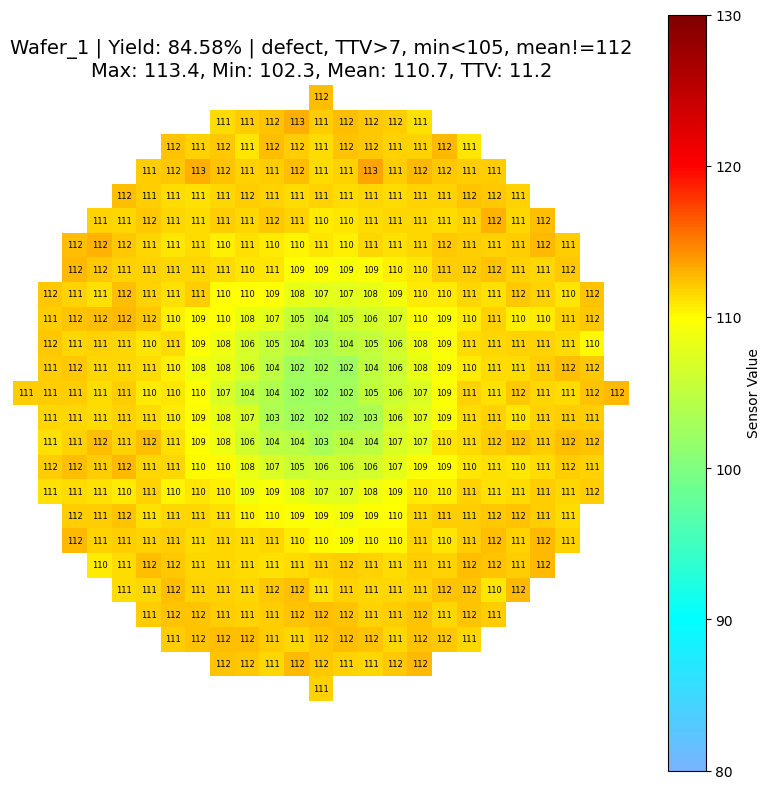

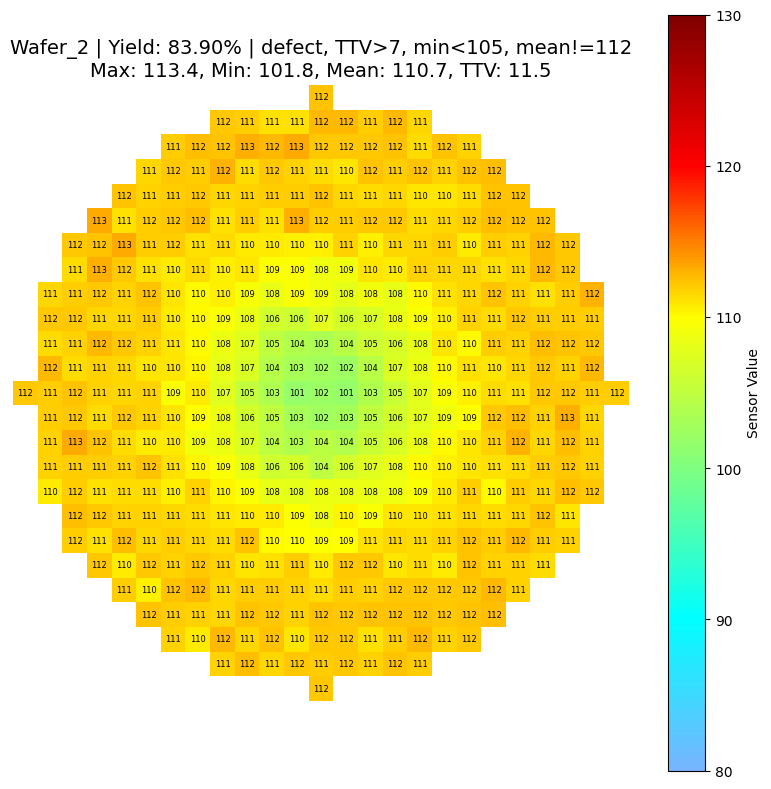

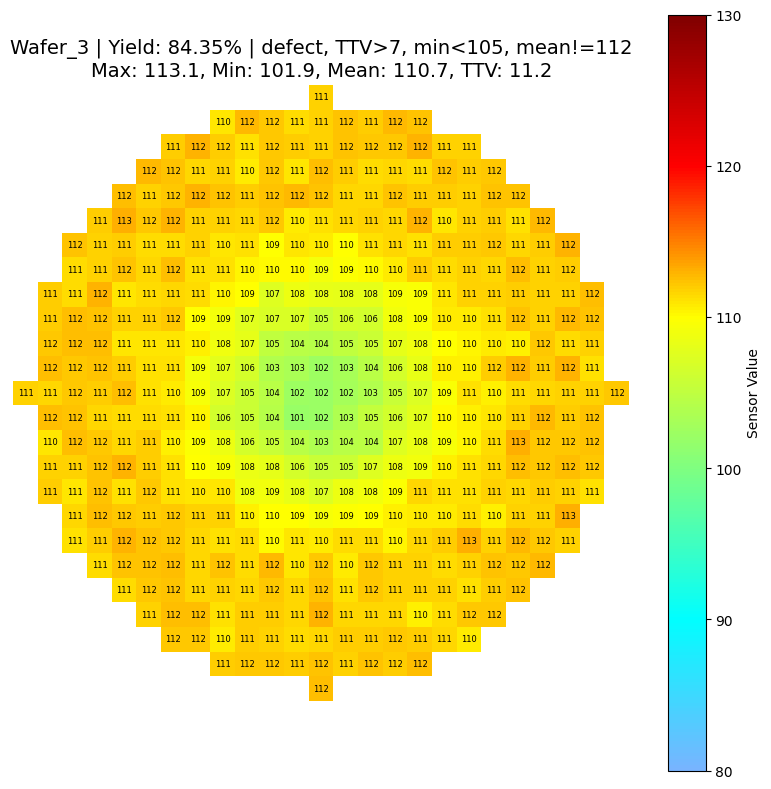

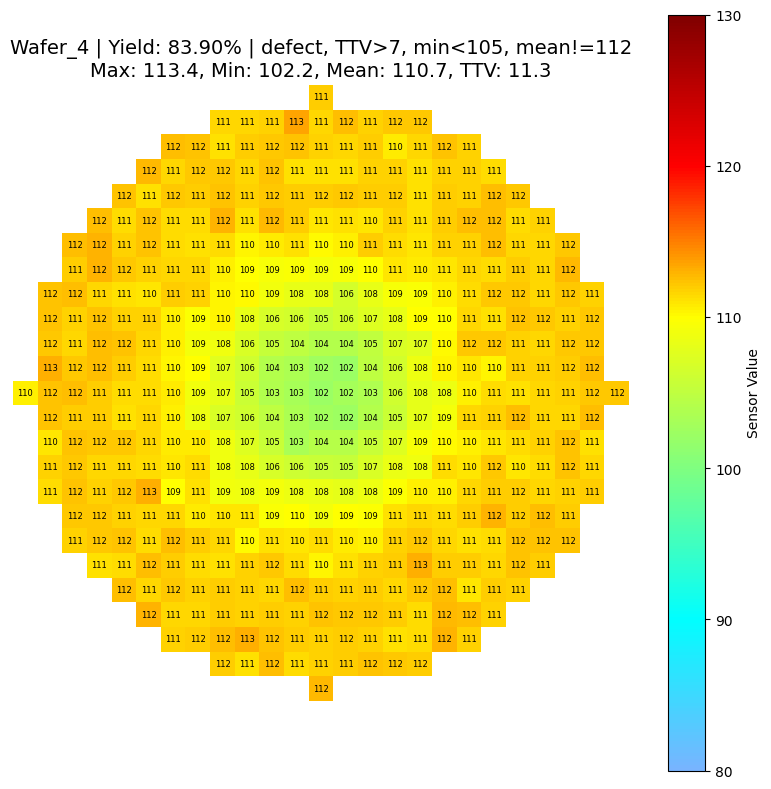

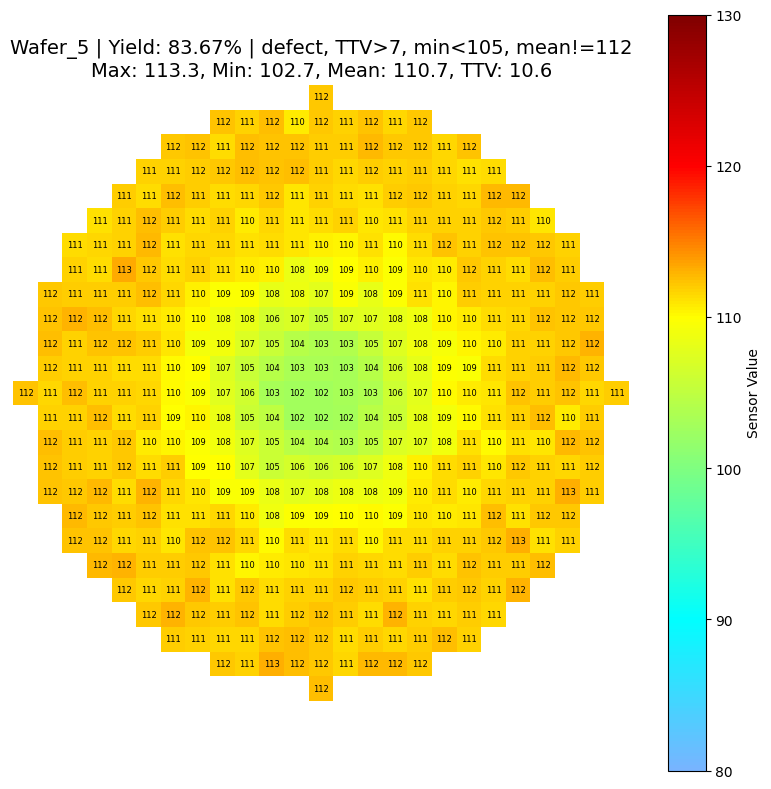

...

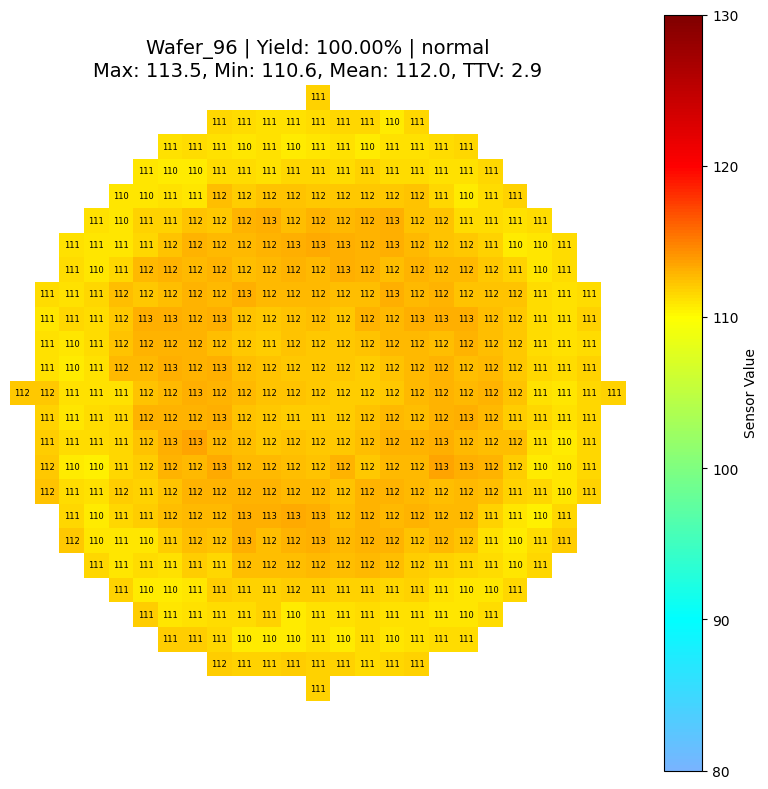

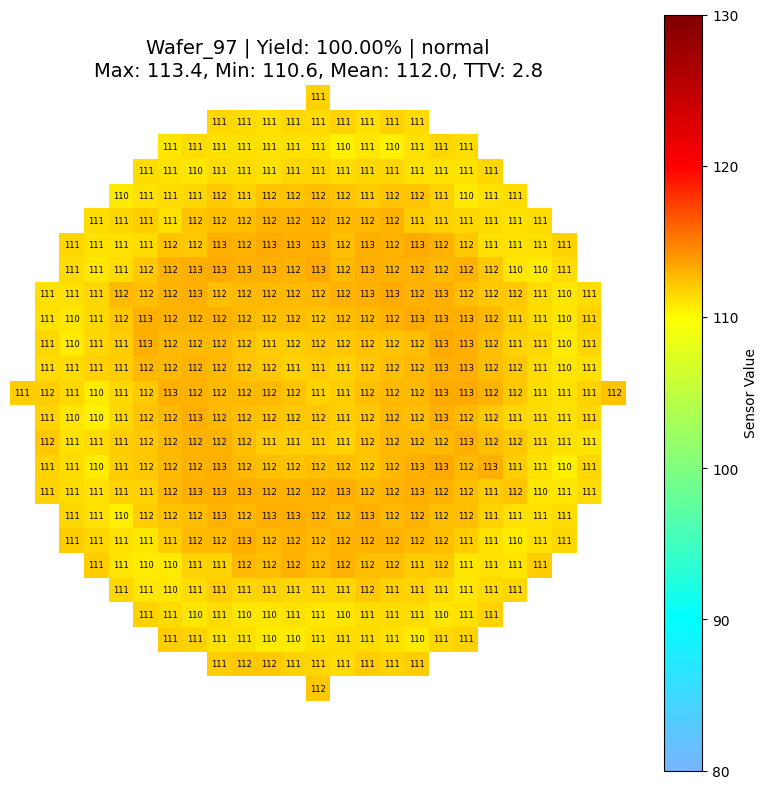

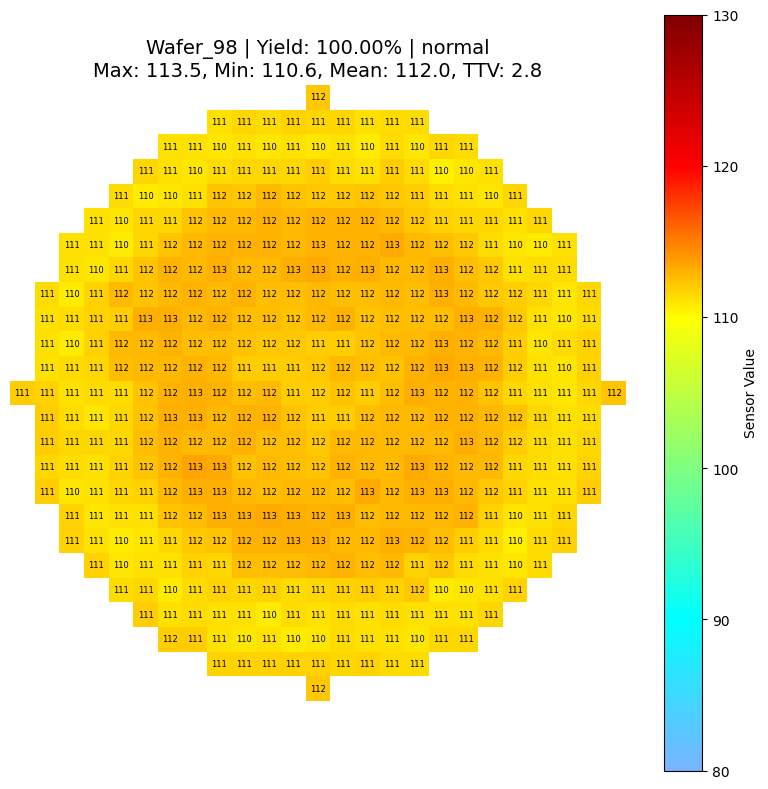

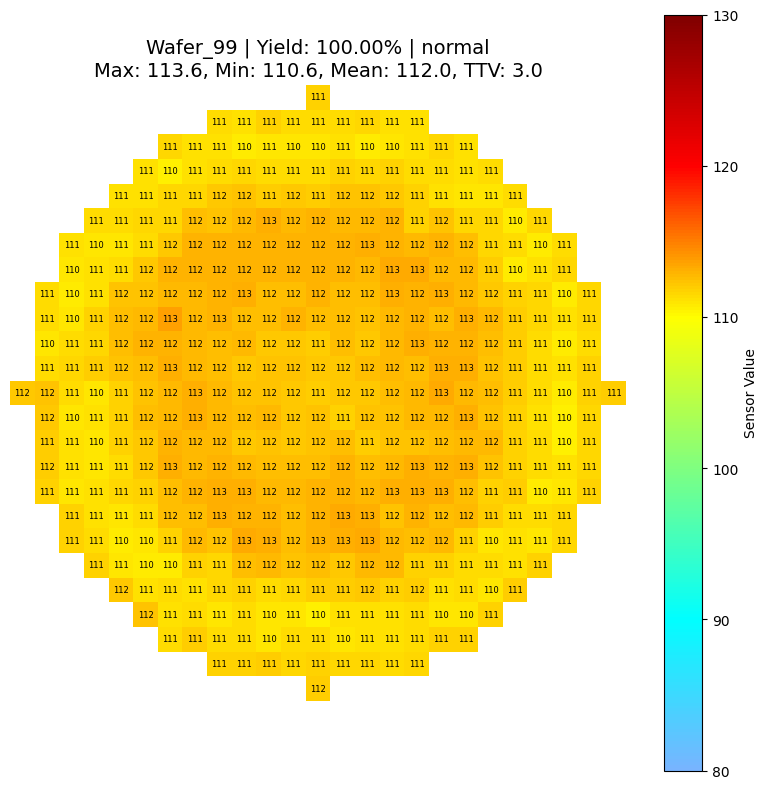

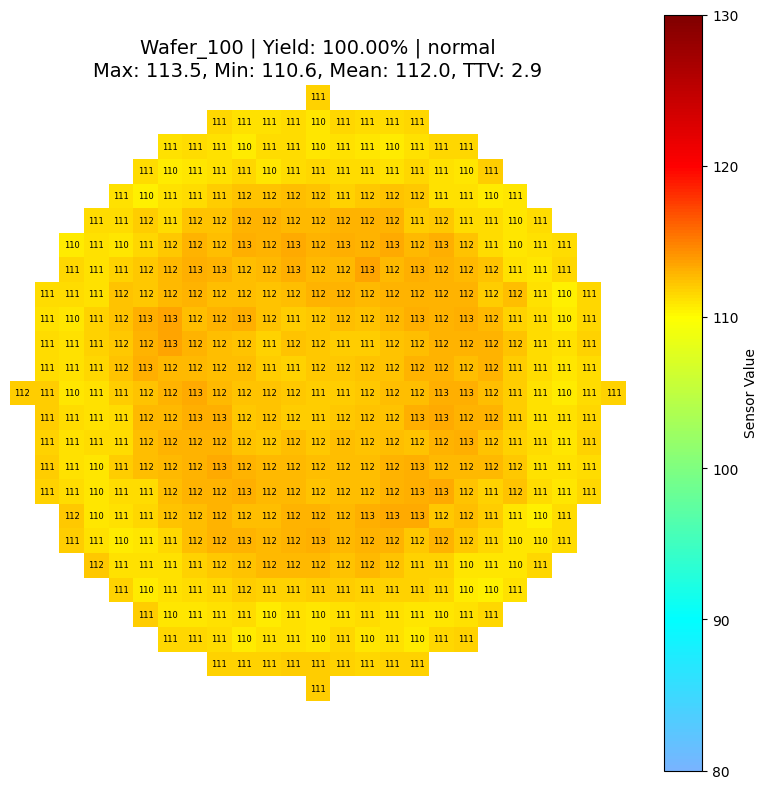

In [13]:
defect_wafer_ids = []

for idx, row in df.iterrows():
    wafer_id = row.get('unnamed: 0', f'Wafer_{idx + 1}')
    sensor_values = pd.to_numeric(row[sensor_cols], errors='coerce').values

    sensor_map = np.full(sensor_shape, np.nan)
    for i, (y, x) in enumerate(final_sorted_coords):
        if i < len(sensor_values):
            sensor_map[y, x] = sensor_values[i]

    normal_sensor = ((sensor_map >= 109) & (sensor_map <= 115))
    normal_count = np.count_nonzero(normal_sensor)
    total_sensor = np.count_nonzero(~np.isnan(sensor_map))
    wafer_yield = normal_count / total_sensor * 100 if total_sensor > 0 else 0

    max_val = np.nanmax(sensor_map)
    min_val = np.nanmin(sensor_map)
    mean_val = np.nanmean(sensor_map)
    ttv = max_val - min_val

    defect_reasons = []
    if ttv > 7:
        defect_reasons.append('TTV>7')
    if wafer_yield < 80:
        defect_reasons.append('yield<80')
    if max_val >= 117:
        defect_reasons.append('max>=117')
    if min_val < 105:
        defect_reasons.append('min<105')
    if mean_val >= 113.0 or mean_val < 111.0:
        defect_reasons.append('mean!=112')

    if defect_reasons:
        defect_label = 'defect, ' + ', '.join(defect_reasons)
    else:
        defect_label = 'normal'

    if defect_label == 'defect':
        defect_wafer_ids.append((wafer_id, defect_label))

    filled_map = fill_nan_with_neighbors(sensor_map, ~mask)
    cmap = LinearSegmentedColormap.from_list('custom', [
        (0, (120/255, 180/255, 255/255)),
        (0.2, (0, 1, 1)),
        (0.4, (0.5, 1, 0.5)),
        (0.6, (1, 1, 0)),
        (0.8, (1, 0, 0)),
        (1.0, (0.5, 0, 0))
    ])

    plt.figure(figsize=(8, 8))
    im = plt.imshow(np.ma.masked_where(~mask, filled_map), cmap=cmap, vmin=80, vmax=130)
    title = (
        f'{wafer_id} | Yield: {wafer_yield:.2f}% | {defect_label}\n'
        f'Max: {max_val:.1f}, Min: {min_val:.1f}, Mean: {mean_val:.1f}, TTV: {ttv:.1f}'
    )
    plt.title(title, fontsize=14)
    plt.colorbar(im, label='Sensor Value')

    for i in range(rows):
        for j in range(cols):
            if mask[i, j]:
                val = sensor_map[i, j]
                text_color = 'blue' if np.isnan(val) else 'black'
                text_val = f'{filled_map[i, j]:.0f}' if np.isnan(val) else f'{int(val)}'
                plt.text(j, i, text_val, ha='center', va='center', fontsize=6, color=text_color)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [19]:
defect_count = 0
normal_count = 0
yield_sum = 0
wafer_cnt = 0

for idx, row in df.iterrows():
    wafer_id = row.get('unnamed: 0', f'Wafer_{idx + 1}')
    sensor_values = pd.to_numeric(row[sensor_cols], errors='coerce').values

    sensor_map = np.full(sensor_shape, np.nan)
    for i, (y, x) in enumerate(final_sorted_coords):
        if i < len(sensor_values):
            sensor_map[y, x] = sensor_values[i]

    # 정상 범위 센서값 개수로 수율 계산
    normal_sensor = ((sensor_map >= 109) & (sensor_map <= 115))
    normal_count_per_wafer = np.count_nonzero(normal_sensor)
    total_sensor = np.count_nonzero(~np.isnan(sensor_map))
    wafer_yield = normal_count_per_wafer / total_sensor * 100 if total_sensor > 0 else 0

    yield_sum += wafer_yield
    wafer_cnt += 1

    max_val = np.nanmax(sensor_map)
    min_val = np.nanmin(sensor_map)
    mean_val = np.nanmean(sensor_map)
    ttv = max_val - min_val

    if ttv > 7:
        defect_label = 'defect'
    else:
        count = 0
        if max_val >= 120:
            count += 1
        if min_val < 90:
            count += 1
        if mean_val < 100:
            count += 1
        defect_label = 'defect' if count >= 3 else 'normal'

    if defect_label == 'defect':
        defect_count += 1
    else:
        normal_count += 1

total = defect_count + normal_count
yield_rate = normal_count / total * 100 if total > 0 else 0
mean_yield = yield_sum / wafer_cnt if wafer_cnt > 0 else 0

print(f"defect 웨이퍼: {defect_count}장")
print(f"normal 웨이퍼: {normal_count}장")
print(f"전체 웨이퍼: {total}장")
print(f"전체 yield(수율): {yield_rate:.2f}%")
print(f"평균 yield(평균 수율): {mean_yield:.2f}%")

defect 웨이퍼: 91장
normal 웨이퍼: 9장
전체 웨이퍼: 100장
전체 yield(수율): 9.00%
평균 yield(평균 수율): 81.79%
